<a href="https://colab.research.google.com/github/DHI-GRAS/CTCN-workshop-2023/blob/main/notebooks/module_3_rivers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Timeseries analysis of river morphology and early warning alerts

This module corresponds to the methodology outlined in section 4.2 of the training manual and section 5.3 explains the workflow step-by-step. 

This module includes code examples as well as theoretical discussions about river erosion and early warning alerts.  
 

Upon completion of this notebook, you will be able to:

* Load the SWE image Collection
* Calculate Surface Water Frequency (SWF) 
* Understand & apply linear regression to our data
* Identify areas with a long term risk of erosion 
* Visualize and export your results to Google Drive.




# Introduction

In this module we will be working with a stack (or time-series) of land-water classifications similar to what was explored in the previous module. We will produce 2 main products in this model.  

 

1.   The first product is useful for indicating areas of permanent water vs seasonal inundation and is named **surface water frequency (SWF)**.  
2.   The second product will be derived from **linear regression** and show the risk of erosion which could be integrated into an early warning system. 

The below image represents the processing pipeline for this module. It provides a good overview of how we will process data in this notebook. Do not worry, we will explain each step further down!

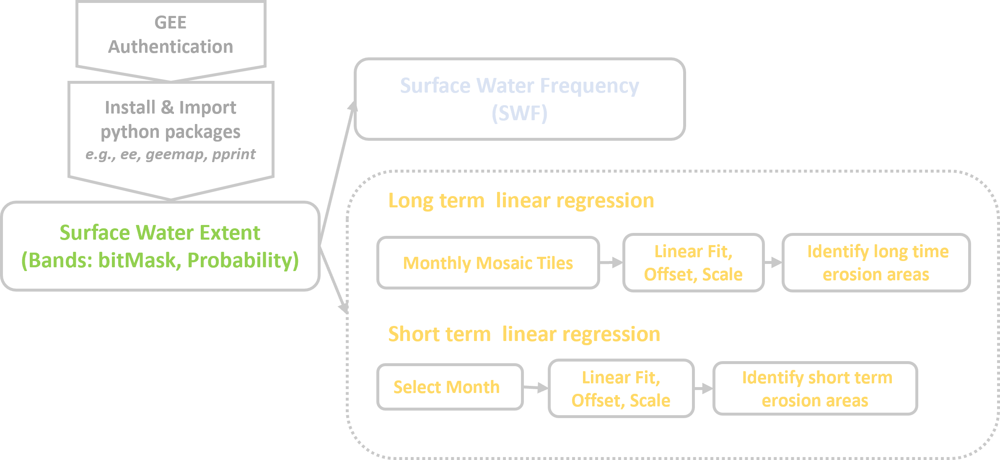

# GEE Authentication
First, we are going to set up our working environment by installing and importing any dependencies for our analysis. This includes the core GEE API, as well as some additional libraries that help us interact with the data in a Python environment.

In [1]:
# Install the earthengine-api.
!pip install -q earthengine-api

# Import the Earth Engine library.
import ee

# Trigger the authentication flow.
ee.Authenticate()
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=Q5iDC03OfkEbH8PrXp3HqaGXtbJqKwLxNioluup9L6g&tc=V6J7JpDJxLgmJqls5nBDA1s0BSg3BEMc6S88TZAlcrk&cc=xYEXKjxvU2Znb9lsfyg_SoOr2ItjoXKZ6yaA4yjCcZQ

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AbUR2VMYGjmTn_p8-CEfdpVQ_VLhwIkvEf86NclwBlhV2O04E5RHO-Qf9RM

Successfully saved authorization token.


# Install and import the python libraries
Geemap is the python package for interactive mapping with Google Earth Engine (GEE).


In [2]:
# Install geemap library.
%%capture
!pip install geemap

The pprint library makes it easier to read some formated data structures 

In [3]:
# Import the geemap library.
import geemap

# Import the ppring library.
import pprint

> **TIP:**  You can read more about geemap package [here](https://geemap.org/)

# Define our area of interest (AOI)


Now, we define our AOI where we will build our river erosion and early warning. 



In [4]:
AOI = ee.Geometry.Polygon([[[87.73953022004099,26.652353807780315],
                            [88.35742018560057,21.447103729072850],
                            [91.61615193167512,21.931984735603734],
                            [91.95699773183236,20.591099725222520],
                            [93.28967194246002,20.861995449326884],
                            [92.43595893040606,25.645152012106962],
                            [90.08964501735568,25.390898843060670],
                            [89.81696245553417,26.884132797824137],
                            [87.73953022004099,026.6523538077803150]]])
# Add the AOI to the Map.
Map = geemap.Map(height = 400, draw = True)
Map.add_basemap("TERRAIN")
Map.addLayer(AOI, {}, "AOI")
Map.centerObject(AOI, 6)
Map

Map(center=[23.743453846118303, 90.39498227972437], controls=(WidgetControl(options=['position', 'transparent_…

> **TIP:**
 *  You are free to modify the AOI, but it is good practice to work with a small area while prototyping methods. Then, once the workflow is established, scaling to a larger area. This is to optimize the speed of development and reduce the compute requirements.  
 * If you are only interested in the Bangladesh's boundary, you can use the Global Administrative Unit Layers:  [FAO/GAUL_SIMPLIFIED_500m](https://developers.google.com/earth-engine/datasets/catalog/FAO_GAUL_SIMPLIFIED_500m_2015_level0#description). You can filter the Bangladesh's boundary based on the ADM0_NAME (UN country name) attribute in the table scheme. 
```
AOI = ee.FeatureCollection("FAO/GAUL_SIMPLIFIED_500m/2015/level0").filter(
    ee.Filter.eq('ADM0_NAME', 'Bangladesh')).first()




# 1) Surface Water Extent (SWE) product

For the surface water extent, we'll use the acronym SWE. This image collection has been pre-created by applying the almost similar land-water classification method from Module 2. The method was applied to an entire time-series enables us to determine areas of change. 


In [5]:
# You can see we're loading an imageCollection (a series of images).
SWE = ee.ImageCollection('projects/worldwater/assets/bangladesh/swe')

# First, let's see how many images are in the imageCollection.
print(f'Number of images in the collection: {SWE.size().getInfo()}')


Number of images in the collection: 770


Now, we know that image collection has 770 images. We will explore the data as it is a key part of any analysis. We will select and look at the first image of the SWE image collection using `getInfo()`. We'll use `pprint` to return the description of the image in a nicer structure.


*Q: How many bands do this collection have?*

In [6]:
# Get the first image
first_image = SWE.first()

# We will use the pprint library for this one. It has a complex structure.
# We will print metadata about the bands and properties in the image.
pprint.pprint(first_image.getInfo())

{'bands': [{'crs': 'EPSG:4326',
            'crs_transform': [8.983152841195215e-05,
                              0,
                              91.62815898019119,
                              0,
                              -8.983152841195215e-05,
                              21.559566818868515],
            'data_type': {'max': 255,
                          'min': 0,
                          'precision': 'int',
                          'type': 'PixelType'},
            'dimensions': [20000, 20000],
            'id': 'probability'},
           {'crs': 'EPSG:4326',
            'crs_transform': [8.983152841195215e-05,
                              0,
                              91.62815898019119,
                              0,
                              -8.983152841195215e-05,
                              21.559566818868515],
            'data_type': {'max': 255,
                          'min': 0,
                          'precision': 'int',
                          

We can see in the description from the first image that there are two bands ("bitMask" and "probability"). In the properties the system:index is readable, and we have information on when the product was generated, the year and month it corresponds to and a GridID. 

It's important to check the properties of your image so that we can utilise them, especially when they are representative of larger collections. For example we could now create a mosaic of all the images from a specific year and month and compile that into a larger image. 

In [7]:
# Visualise the first image.

yellow_blue = ['#ffffcc','#c7e9b4','#7fcdbb','#41b6c4','#2c7fb8','#253494']

Map = geemap.Map(center=[23, 90], zoom=6, height=400, draw = True)
Map.add_basemap("TERRAIN")
Map.addLayer(AOI, {}, "AOI")
Map.addLayer(first_image, {'bands': ['bitMask'], 'min': 1, 'max': 5, 'palette': ['#ff4c4c','#e5c100','#00b3ff']},'First image (bitMask) ')
Map.addLayer(first_image, {'bands': ['probability'], 'min': 0, 'max': 100, 'palette': yellow_blue},'First image (probability) ')
Map

Map(center=[23, 90], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Tog…

We can see the "first" image intersects the lower right of our AOI. There are two bands: 

* **Probability band** - This is the water probability from 0 to 100. Water is coloured in blue and land in yellow. 

* **BitMask band** - This tells us what data was used to create that probability score. In this case the bitMask scores are slightly different to module 2. 

  * 5 (Blue Colour): Sentinel-2 and Sentinel-1 

  * 4 (Green Colour): Sentinel-2 

  * 1 (Red Colour): Sentinel-1 

You might also notice that there are quite a few areas that are masked (or missing). These coincide with more mountainous areas which can cause problems for a classification. Therefore, this product has removed those areas to avoid false positives. 

Now, will add date property  using properties we already have

In [8]:
# Add a date property using the properties we already have.
def add_timestart (image):
  year = image.getNumber('year')
  month = image.getNumber('month')
  # Returns a Date given year and month (milliseconds).
  date = ee.Date.fromYMD(year, month, 1).millis() 
  return image.set('system:time_start', date)

# Map that function to all images in the collection.
SWE = SWE.map(add_timestart)

# Earliest date.
earliest_date = SWE.aggregate_min('system:time_start')
print(earliest_date.getInfo())

1483228800000


This isn't very readable. It tells us the number of milliseconds since the epoch.
Let's format it to something sensible.


In [9]:
earliest_date = ee.Date(earliest_date).format('YYYY-MM-dd')
print(earliest_date.getInfo())

2017-01-01


Much nicer. We can see the earliest image we have is from 2017-01. 

Let's look for the latest image now so we know the time range we have data for.

In [10]:
latest_date = SWE.aggregate_max('system:time_start')
latest_date = ee.Date(latest_date).format('YYYY-MM-dd')
print(latest_date.getInfo())

2022-10-01


In [11]:
print(f'Ok - so we have data available in the range {earliest_date.getInfo()} to {latest_date.getInfo()}')

Ok - so we have data available in the range 2017-01-01 to 2022-10-01


Now let's "stitch" the data together from the SWE collection for a year and month over the entire AOI so we will get a single image. The **mosaic** function composites images according to their position in the collection (priority is last to first).


In [12]:
year = 2022
month = 3 #March

# Select all images over March 2022 from the collection and mosaic them. 
mosaic_image = SWE.filter([
    ee.Filter.eq('year', year), 
    ee.Filter.eq('month', month)
    ]).mosaic()

# Visualize.
Map = geemap.Map(center=[23, 90], zoom=6, height=400, draw = True)
Map.add_basemap("TERRAIN")
Map.addLayer(mosaic_image, {'bands': ['bitMask'], 'min': 1, 'max': 5},'Mosaic image (bitMask) ')
Map.addLayer(mosaic_image, {'bands': ['probability'], 'min': 0, 'max': 100, 'palette': yellow_blue},'Mosaic image (probability) ')
Map

Map(center=[23, 90], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Tog…

Cool. Now we can see we have data covering all of the country. 
>**TIP**: Feel free to change the year and month and see how the product changes throughout the timeseries. 

# 2) Surface Water Frequency (SWF) product

We will create the SWF product which will be used for indicating areas of permanent water vs seasonal inundation.   

First, we will obtain the water observation layer by thresholding the water probability (e.g.,70%) for each scene from the SWE image collection. This will lead to collections of land water binary masks. Then, we will sum all water observations per pixel. Eventually, this sum image will be divided by the total number of observations for each pixel, which will create the final SWF product. This product has a value between 0-100 and tells us "how often that pixel is water as a percentage".

In [13]:
# Define a threshold which will be used to convert our "probability".
water_threshold = 75

# Define the function for convertin all scenes into binary images.
def convert_probability_to_binary (image):
  probability_band = image.select('probability')
  binary_image = probability_band.gte(water_threshold)
  return binary_image

# Apply the function to our collection.
SWE_binary = SWE.map(convert_probability_to_binary)

# Take the sum (the number of times water is observed).
SWE_sum = SWE_binary.sum()

# Take the count (the total number of images).
SWE_count = SWE_binary.count()

# Create SWF.
SWF = SWE_sum.divide(SWE_count).multiply(100)

# blue palette.
blues = ['#fff7fb','#ece7f2','#d0d1e6','#a6bddb','#74a9cf','#3690c0','#0570b0','#045a8d','#023858']

# Visualize.
Map = geemap.Map(center=[23, 90], zoom=6, height=400, draw = True)
Map.add_basemap("TERRAIN")
Map.addLayer(AOI, {'color': 'black'}, 'AOI')
Map.addLayer(SWF, {'min': 0, 'max': 100, 'palette': blues},'Surface Water Frequency')
Map

Map(center=[23, 90], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Tog…

Export the data to your google drive. 
* It will take roughly 1hr to export to your google drive and will have a filesize of ~800 MB. 
* The layer will have only one band with values between 0 to 100.

In [14]:
task = ee.batch.Export.image.toDrive(
            image = SWF.uint8(),
            description = 'SWF',
            folder = 'CTCN-workshop',
            region = AOI,
            scale = 10,
            maxPixels = 10e12,
            fileDimensions= 256*4*100, 
            shardSize= 256*4,
            formatOptions = {'cloudOptimized': True})

task.start()

>**TIP:** Check the code editor: https://code.earthengine.google.com/tasks to see the status of your export or run task.status() command, which returns a dictionary containing information such as the state of the task and its ID.

# 3) Long term linear regression.

Computing long term linear regression across the SWE time-series can enable greater insights into long-term changes. It shows that some pixels are getting "wetter" or "drier", which could be seen as a proxy of erosion and accretion. Thresholding values that are getting wetter (positive trend) and then buffering them by an ‘at-risk’ distance is a simple yet effective method to determine this since the direction of erosion is likely to continue. 

> ***What is linear regression?***
>Linear regression models use a straight line, which describes the relationship between variables. Regression allows you to estimate how a dependent variable changes as the independent variable(s) change. In our case data should be set up as a two-band input image, where the first band is the independent variable, e.g., water probability, and the second band is the dependent variable, e.g., time.  


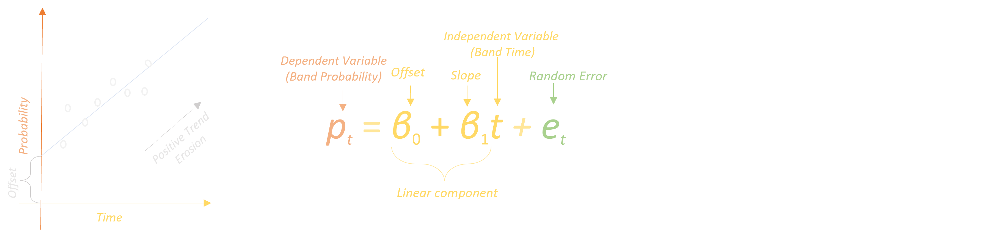

Now, we will start adding the time band. We need to access the time property and encode that as an image.

In [15]:
# Define the function of adding the time band.
def add_time_band (image):

  # Returns a Date given year, month, day (2017-01-01).
  basedate = ee.Date.fromYMD(2017, 1, 1) 

  # Extract the date from the properties within each image.
  ymd = ee.Date.fromYMD(image.getNumber('year'), image.getNumber('month'), 1)

  # compute the difference between the dates, with units month, and cast as an image.
  time_difference = ee.Image(ymd.difference(basedate, 'month')).float().rename('time')

  # Add a new time band formatted as YYYY-MM-dd.
  return image.addBands(time_difference).set(
      'ymd', ymd.format('YYYY-MM-dd'),
      'system:time_start', ymd.millis()
      )

# Apply that function to our collection.
SWE_time = SWE.map(add_time_band)

In [16]:
SWE_time

We have added a new band "time", and also set some time properties ('`ymd`', '`system:time_start`').

Now, we will mosaic into nation-wide maps rather than tiles and keep the time properties. Our "tiled" collection will become a collection where there is only 1 image per month.

In [17]:
# Define the function for creating mosaic for each month.
def mosaic_tiles(unique_month, collection):
  filtered = collection.filter(ee.Filter.eq('ymd', unique_month))
  first_image = filtered.first()
  return filtered.mosaic().copyProperties(
      first_image, ['system:time_start', 'ymd'])

# Get the unique months.
unique_months = SWE_time.aggregate_array('ymd').distinct()

# Apply our mosaic_tiles function using a lambda expression. 
SWE_months = ee.ImageCollection(unique_months.map(lambda month: mosaic_tiles(month, SWE_time)))


The collection is  now ready for our analysis. Let's compute linear regression.
The data should be set up as a two-band input image, where the first band is the independent variable (Time) and the second band is the dependent variable (Probability). 

In [18]:
# Reduce the collection with the linear fit reducer.
linear_fit = SWE_months.select(['time', 'probability']).reduce(ee.Reducer.linearFit(), 2)

In [19]:
linear_fit

We can see that after applying the linear fit reducer our image collection has been converted to an image with two bands: scale and offset.

- **Scale**: Tells us at what rate the water probability is changing. The units are change in water probability per month. This is probably the most interesting band since it tells us which pixels are getting wetter or drier, or remain the same.

- **Offset**: Tells us where our linear expression crosses the y axis when time difference is 0 (i.e., 2017-01-01)


In [20]:
# Visualize.
Map = geemap.Map(center=[23, 90], zoom=8, height=900, draw = True)
Map.add_basemap("TERRAIN")
red_blue = ['#ca0020','#FFFFFF00','#0571b0']
Map.addLayer(linear_fit, {'bands': ['offset'], 'min': 0, 'max': 100, 'palette': red_blue},'Linear Reg. (offset)')
Map.addLayer(linear_fit, {'bands': ['scale'], 'min': -2, 'max': 2, 'palette': red_blue},'Linear Reg. (scale)')
Map

Map(center=[23, 90], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Tog…

## 3.1) Identify erosion areas

Let's focus on erosion (blue colour) as this is likely to be more problematic. 

We can define erosion, using liner regression, as somewhere where:
- scale has increased (it got "wetter").
- offset should be low (originally land).


In [21]:
# Probability must be increasing (getting wetter).
scale_mask = linear_fit.select('scale').gte(1)

# Offset must have been land in the begginning.
offset_mask = linear_fit.select('offset').lte(50) 

# Combine the masks.
erosion = scale_mask.And(offset_mask)

# Keep only these areas in our visualisation. 
linear_fit_masked = linear_fit.updateMask(erosion)

# Visualise.
Map = geemap.Map(center=[23.35, 90.45], zoom=10, height= 700, draw = True)
Map.add_basemap("TERRAIN")
Map.addLayer(linear_fit, {'bands': ['offset'], 'min': 0, 'max': 100, 'palette': red_blue},'Linear Reg. (offset)', False)
Map.addLayer(linear_fit, {'bands': ['scale'], 'min': -2, 'max': 2, 'palette': red_blue},'Linear Reg. (scale)', False)
Map.addLayer(erosion, {'min': 0, 'max': 1, 'palette': red_blue}, 'erosion mask', False)
Map.addLayer(linear_fit_masked, {'bands': ['offset'], 'min': 0, 'max': 100, 'palette': red_blue},'Erosion (offset)')
Map.addLayer(linear_fit_masked, {'bands': ['scale'], 'min': -3, 'max': 3, 'palette': red_blue},'Erosion (scale)')
Map

Map(center=[23.35, 90.45], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childre…

We will create a batch task to export the linear_fit image and vector version to your drive.
Export the data to your google drive. 
* It will take ~1-2 hr to obtain these two layers to your drive. 

In [22]:
# Export raster data.
task = ee.batch.Export.image.toDrive(
            image = linear_fit_masked.select('scale').byte(),
            description = 'Long_LR_erosion_raster',
            folder = 'CTCN-workshop',
            region = AOI,
            scale = 10,
            maxPixels = 10e12,
            fileDimensions= 256*400, 
            shardSize= 256*4,
            formatOptions = {'cloudOptimized': True})
task.start()



or export it as a vector which might be more useful to integrate into existing systems. It will also likely be a much smaller file size.

In [23]:
# Convert raster to vector.
vector = erosion.selfMask().addBands(
    linear_fit_masked.select('scale')
    ).reduceToVectors(**{
        'reducer': ee.Reducer.mean(), 
        'geometry': AOI, 
        'scale': 10, 
        'eightConnected': True, 
        'labelProperty': 'label', 
        'bestEffort': True, 
        'maxPixels': 10e12, 
        'tileScale': 4
        })
    

# Add an area property in km2
vector = vector.map(lambda f: f.set('area', f.geometry(1).area(10).divide(1000*1000)))


In [24]:
# Export vector data.
task = ee.batch.Export.table.toDrive(
            collection = vector,
            description = 'Long_LR_erosion_vector',
            folder = 'CTCN-workshop',
            fileFormat = 'GEOJSON'
            )
task.start()


>**TIP:** Check the code editor: https://code.earthengine.google.com/tasks to see the status of your export or run task.status() command, which a dictionary containing information such as the state of the task and its ID.

## 3.2) Identify areas at risk of erosion

We can take our erosion areas, apply a morphological operation known as an "opening" to remove small pixels, then buffer the remaining areas to identify areas that might be at risk of future erosion.



In [25]:
## Apply an erosion and then a dilation (also known as 'opening').
## this only creates a buffer around 'at risk' pixels >50m diameter.
erosion_risk = erosion.focal_min(
    radius=25, 
    kernelType='circle', 
    units='meters'
    ).focal_max(
        radius=170, 
        kernelType='circle', 
        units='meters'
        )

## Remove already eroded areas and remove water.
erosion_risk = erosion_risk.updateMask(
            erosion.Not().And(offset_mask)
            ).selfMask() 


In [26]:
# Visualise.
Map = geemap.Map(center=[23.35, 90.45], zoom=10, height= 700, draw = True)
Map.add_basemap("SATELLITE")
Map.addLayer(AOI, {'color': 'black'}, 'AOI', False)
Map.addLayer(linear_fit, {'bands': ['scale'], 'min': -2, 'max': 2, 'palette': red_blue},'Linear Reg. (scale)', True)
Map.addLayer(erosion, {'min': 0, 'max': 1, 'palette': red_blue},'erosion', False)
Map.addLayer(erosion_risk, {'palette': ['orange']},'Erosion Risk') ## or yellow '#ffff33'
Map

Map(center=[23.35, 90.45], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childre…

We will create a batch task to export the erosion risk to your drive. This one takes a little longer because the focal operations are fairly compute intensive. 

* It will take ca. 2-3h to obtain this data to your drive. 

In [27]:
# Export raster data.
task = ee.batch.Export.image.toDrive(
            image = erosion_risk.byte(),
            description = 'erosion_risk',
            folder = 'CTCN-workshop',
            region = AOI,
            scale = 10,
            maxPixels = 10e12,
            fileDimensions= 256*400, 
            shardSize= 256*4,
            formatOptions = {'cloudOptimized': True})
task.start()

# 4) Short term linear regression

We have computed and inspected long-term regression. However, this method is unlikely to identify short term changes because the regression coefficient is a product of the entire time-series (over 3 years). 

We could apply the same method but over a shorter time-period, hereon referred to as short term regression. This will still identify areas getting wetter (or drier), but we will be much more sensitive to recent changes in the environment. However, it may be more impacted upon by errors in our data such as cloud cover because the sample population is smaller. Therefore, the results must be inspected critically. 

We create a function that computes linear regression for a 3-month period prior to the images current date. We apply this function to all the predictions in our collection, except for the first couple of months where we don't have a 3-month window at the beginning of the time-series.


In [28]:
# Linear regression (short term).

n_months = 3 #moving window

def short_term_regression(image):
  image_date = image.date()
  start_date = image_date.advance((n_months - 1) * -1, 'month') #2 months backwards
  end_date = image_date.advance(1, 'day') #1 day ahead of current month.

  # Filtered to include the n_months window size.
  filtered_collection = SWE_months.filterDate(start_date, end_date)
  
  # Compute linear fit.
  short_term_lin_reg = filtered_collection.select(['time', 'probability']).reduce(ee.Reducer.linearFit())

  # Add it to our image.
  return image.addBands(short_term_lin_reg)


# Apply the function to our collection.
earliest_date = ee.Date('2017-01-01').advance(n_months - 1, 'month')

# Filter the collection first to exclude the first few months.
short_term_lin_reg_collection = SWE_months.filterDate(
    earliest_date, '2025-01-01'
    ).map(short_term_regression)


In [29]:
SWE_months

In [30]:
short_term_lin_reg_collection

Let's visualise the short term linear regression **collection** we just computed. To do that, we'll use "`ymd`" time property to filter our collection to an **image** of our interest. Feel free to change the date string to something else.

In [31]:
# Choose some dates to investigate.
date_filter = '2019-12-01'

short_term_image = ee.Image(
    short_term_lin_reg_collection.filter(
        ee.Filter.eq('ymd', date_filter)
        ).first()
        )


# Visualise it.
Map = geemap.Map(center=[23, 90], zoom=6, height=500, draw = True)
Map.add_basemap("SATELLITE")
Map.addLayer(AOI, {'color': 'black'}, 'AOI')
Map.addLayer(short_term_image, {'bands': ['probability'], 'min': 0, 'max': 100, 'palette': yellow_blue},'Water probability')
Map.addLayer(short_term_image, {'bands': ['offset'], 'min': -100, 'max': 200, 'palette': red_blue},'Linear Reg. (offset)')
Map.addLayer(short_term_image, {'bands': ['scale'], 'min': -20, 'max': 20, 'palette': red_blue},'Linear Reg. (scale)')
Map

Map(center=[23, 90], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Tog…

In [37]:
# Export the data to your google drive

AOI_small = ee.Geometry.Polygon([[ [90.03, 23.77],
                                   [90.03, 23.26],
                                   [90.47, 23.26],
                                   [90.47, 23.77]]])

task = ee.batch.Export.image.toDrive(
            image = short_term_image.select('scale').int8(),
            description = 'short_term',
            folder = 'CTCN-workshop',
            region = AOI_small,
            scale = 10,
            maxPixels = 10e12,
            fileDimensions= 256*4*50, 
            shardSize= 256*4,
            formatOptions = {'cloudOptimized': True})

task.start()


>**TIP:** Check the code editor: https://code.earthengine.google.com/tasks to see the status of your export or run task.status() command, which a dictionary containing information such as the state of the task and its ID.

If the short term risk of erosion is more important to you than long term, then it may be worthwhile repeating the "erosion risk" identification we computed earlier. The methodology could remain the same, you just need to apply it to these images instead.